# **EE239 Homework 3: Diffusion Models**


Stable Diffusion is a text-to-image latent diffusion model created by the researchers and engineers from [CompVis](https://github.com/CompVis), [Stability AI](https://stability.ai/) and [LAION](https://laion.ai/) similar to the ones we discussed in class. In this homework, we will learn about the core components of Diffusion models by:
* training a simple diffusion model in Section 2
* then in Section 3 exploring how a modern Diffusion model, like Stable Diffusion, works through HuggingFace diffusers library.
* Answering some written questions posed throughout the notebook.

A lot of this notebook is adapted from: https://huggingface.co/learn/diffusion-course/en/unit1/1. If you want to learn more, you can find additional material there!

In [ ]:
 !pip install --upgrade scipy ftfy accelerate huggingface-hub transformers tokenizers diffusers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.6/37.6 MB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 342.1/342.1 kB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.1/468.1 kB 28.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 66.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 52.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import torch
import torchvision
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
from diffusers import DDPMScheduler, UNet2DModel
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
import os
from tqdm import tqdm

if torch.cuda.is_available():
    # Shows the nVidia GPUs, if this system has any
    !nvidia-smi

Thu Mar  6 22:46:56 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   43C    P8             12W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# 1. Introduction

In [ ]:
if torch.cuda.is_available():
    device=torch.device("cuda")
else:
    raise Exception("No GPU found, GPU required!")



We will explore diffusion models, a groundbreaking class of generative models that have revolutionized the way we create images. Diffusion models work by gradually transforming random noise into coherent, high-quality images through a controlled, step-by-step denoising process. One of the most exciting examples of this technology when it was introduced was Stable Diffusion, a latent diffusion model that leverages a lower-dimensional representation to generate images efficiently without sacrificing detail. Try running and playing around with the prompts below to get a sense of the model's capabilities (Note, feel free to change the code to use a different model).

In [ ]:
from diffusers import StableDiffusionPipeline

# Use the GPU.
device=torch.device("cuda")

# Initialize Model
model_id = "stabilityai/stable-diffusion-2-1-base"
pipe = StableDiffusionPipeline.from_pretrained(model_id).to(device)

# Send Model to GPU
pipe = pipe.to(device)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/346 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/807 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/911 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

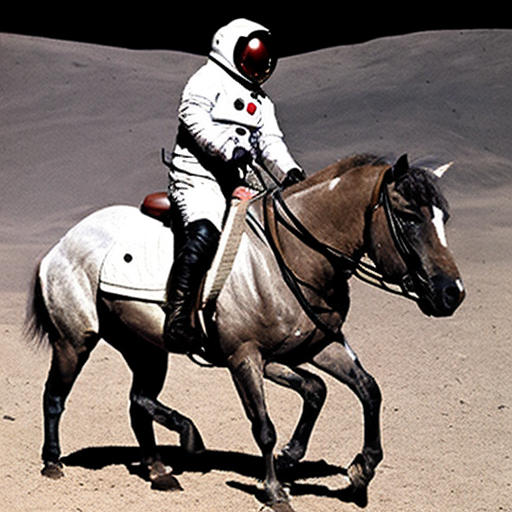

In [ ]:
# Remove generator, or change seed if you want a random image
generator = torch.Generator(device).manual_seed(21)

# Define a prompt!
prompt = "a photograph of an astronaut riding a horse" # @param {type:"string"}
image = pipe(prompt, generator=generator).images[0]

# Now to display an image you can either save it such as:
image.save(f"{prompt}.png")
image

# 2. Diffusion Models from Scatch

Sometimes it is helpful to consider the simplest possible version of something to better understand how it works. We're going to try that in this notebook, beginning with a 'toy' diffusion model to see how the different pieces work, and then examining how they differ from a more complex implementation.

We will look at
- The corruption process (adding noise to data)
- What a UNet is, and how to implement an extremely minimal one from scratch
- Diffusion model training
- Sampling theory

Then we'll compare our versions with the diffusers DDPM implementation, exploring
- Improvements over our mini UNet
- The DDPM noise schedule
- Differences in training objective
- Timestep conditioning
- Sampling approaches

NOTE: (You may need to restart the notebook and not execute any other prior cells due to GPU memory limitations)

In [ ]:
dataset = torchvision.datasets.MNIST(root="mnist/", train=True, download=True, transform=torchvision.transforms.ToTensor())

train_dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 9.91M/9.91M [00:11<00:00, 893kB/s] 


Extracting mnist/MNIST/raw/train-images-idx3-ubyte.gz to mnist/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 28.9k/28.9k [00:00<00:00, 131kB/s]


Extracting mnist/MNIST/raw/train-labels-idx1-ubyte.gz to mnist/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 1.65M/1.65M [00:01<00:00, 1.22MB/s]


Extracting mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to mnist/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 4.54k/4.54k [00:00<00:00, 7.95MB/s]

Extracting mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to mnist/MNIST/raw



## 2.1 Training a Simple Diffusion Model

### The Data

Here we're going to test things with a very small dataset: mnist. If you'd like to give the model a slightly harder challenge without changing anything else, torchvision.datasets.FashionMNIST should work as a drop-in replacement.

Input shape: torch.Size([8, 1, 28, 28])
Labels: tensor([0, 0, 6, 3, 8, 9, 3, 7])


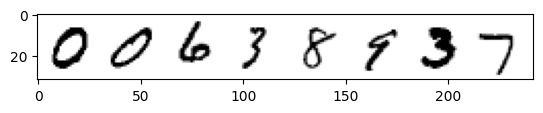

In [ ]:
x, y = next(iter(train_dataloader))
print('Input shape:', x.shape)
print('Labels:', y)
plt.imshow(torchvision.utils.make_grid(x)[0], cmap='Greys');

### The Corruption Process

Pretend you haven't read any diffusion model papers, but you know the process involves adding noise. How would you do it?

We probably want an easy way to control the amount of corruption. So what if we take in a parameter for the `amount` of noise to add, and then we do:

`noise = torch.rand_like(x)`

`noisy_x =  (1-amount)*x + amount*noise`

If amount = 0, we get back the input without any changes. If amount gets up to 1, we get back noise with no trace of the input x. By mixing the input with noise this way, we keep the output in the same range (0 to 1).

We can implement this fairly easily (just watch the shapes so you don't get burnt by broadcasting rules):

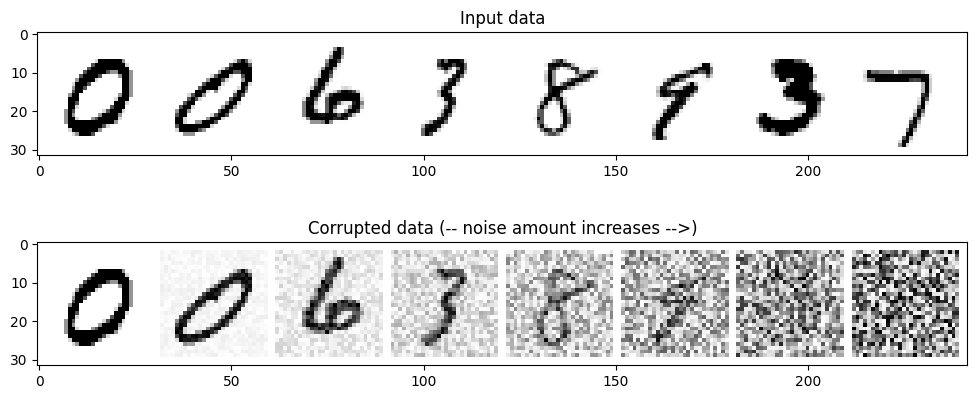

In [ ]:
def corrupt(x, amount):
    """Corrupt the input `x` by mixing it with noise according to `amount`"""
    noise = torch.rand_like(x)
    amount = amount.view(-1, 1, 1, 1) # Sort shape so broadcasting works
    return x*(1-amount) + noise*amount

# Plotting the input data
fig, axs = plt.subplots(2, 1, figsize=(12, 5))
axs[0].set_title('Input data')
axs[0].imshow(torchvision.utils.make_grid(x)[0], cmap='Greys')

# Adding noise
amount = torch.linspace(0, 1, x.shape[0]) # Left to right -> more corruption
noised_x = corrupt(x, amount)

# Plotting the noised version
axs[1].set_title('Corrupted data (-- noise amount increases -->)')
axs[1].imshow(torchvision.utils.make_grid(noised_x)[0], cmap='Greys');

### The Model

We'd like a model that takes in a 28px noisy images and outputs a prediction of the same shape. A popular choice here is an architecture called a UNet. [Originally invented for segmentation tasks in medical imagery](https://arxiv.org/abs/1505.04597), a UNet consists of a 'constricting path' through which data is compressed down and an 'expanding path' through which it expands back up to the original dimension (similar to an autoencoder) but also features skip connections that allow for information and gradients to flow across at different levels.

Some UNets feature complex blocks at each stage, but for this toy demo we'll build a minimal example that takes in a one-channel image and passes it through three convolutional layers on the down path (the down_layers in the diagram and code) and three on the up path, with skip connections between the down and up layers. We'll use max pooling for downsampling and `nn.Upsample` for upsampling rather than relying on learnable layers like more complex UNets. Here is the rough architecture showing the number of channels in the output of each layer:

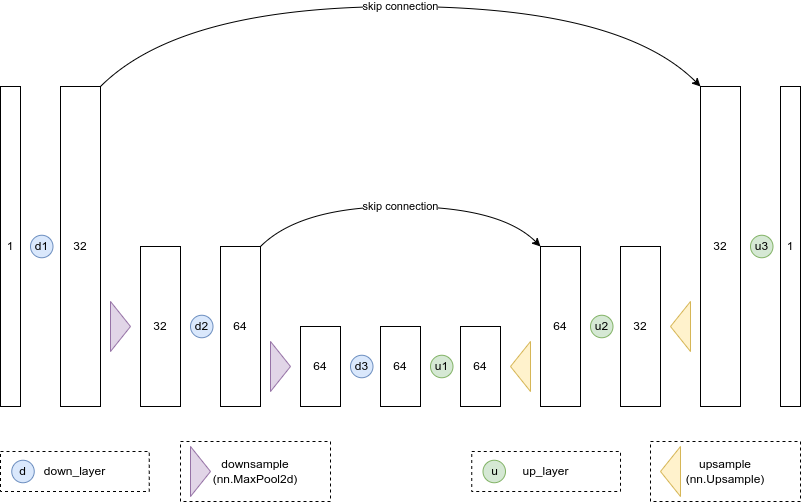

In [ ]:
class BasicUNet(nn.Module):
    """A minimal UNet implementation."""
    def __init__(self, in_channels=1, out_channels=1):
        super().__init__()
        self.down_layers = torch.nn.ModuleList([
            nn.Conv2d(in_channels, 32, kernel_size=5, padding=2),
            nn.Conv2d(32, 64, kernel_size=5, padding=2),
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
        ])
        self.up_layers = torch.nn.ModuleList([
            nn.Conv2d(64, 64, kernel_size=5, padding=2),
            nn.Conv2d(64, 32, kernel_size=5, padding=2),
            nn.Conv2d(32, out_channels, kernel_size=5, padding=2),
        ])
        self.act = nn.SiLU() # The activation function
        self.downscale = nn.MaxPool2d(2)
        self.upscale = nn.Upsample(scale_factor=2)

    def forward(self, x):
        h = []
        for i, l in enumerate(self.down_layers):
            x = self.act(l(x)) # Through the layer and the activation function
            if i < 2: # For all but the third (final) down layer:
              h.append(x) # Storing output for skip connection
              x = self.downscale(x) # Downscale ready for the next layer

        for i, l in enumerate(self.up_layers):
            if i > 0: # For all except the first up layer
              x = self.upscale(x) # Upscale
              x += h.pop() # Fetching stored output (skip connection)
            x = self.act(l(x)) # Through the layer and the activation function

        return x

We can verify that the output shape is the same as the input, as we expect:

In [ ]:
net = BasicUNet()
x = torch.rand(8, 1, 28, 28)
net(x).shape

torch.Size([8, 1, 28, 28])

In [ ]:
num_params = sum([p.numel() for p in net.parameters()])
print(f"The model has {num_params} parameters.")

The model has 309057 parameters.


### Training the network

So what should the model do, exactly? Again, there are various takes on this but for this demo let's pick a simple framing: given a corrupted input noisy_x the model should output its best guess for what the original x looks like. You will need to implement a loss function that will allow the model to do this in `student_loss_function`.

Once you have implemented it, we can now have a go at training the network.
- Get a batch of data
- Corrupt it by random amounts
- Feed it through the model
- Compare the model predictions with the clean images to calculate our loss
- Update the model's parameters accordingly.

Feel free to modify this and see if you can get it working better!

In [ ]:
import torch.nn.functional as F
def student_loss_function(x, x_hat):
    """Implement your own loss function here."""
    return F.mse_loss(x_hat, x)

100%|██████████| 469/469 [00:11<00:00, 41.06it/s]


Finished epoch 0. Average loss for this epoch: 0.026088


100%|██████████| 469/469 [00:10<00:00, 43.66it/s]


Finished epoch 1. Average loss for this epoch: 0.020020


100%|██████████| 469/469 [00:10<00:00, 43.75it/s]


Finished epoch 2. Average loss for this epoch: 0.018660


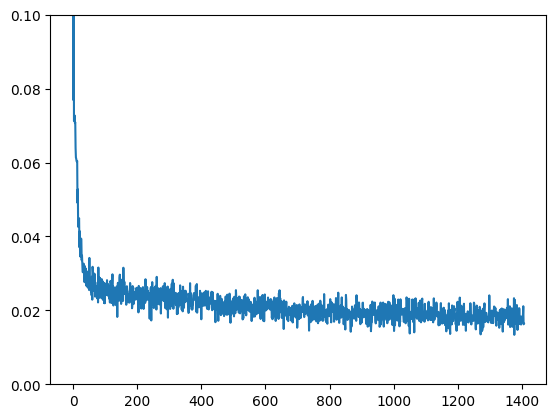

In [ ]:
# Dataloader (you can mess with batch size)
batch_size = 128
train_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# How many runs through the data should we do?
n_epochs = 3

# Create the network
net = BasicUNet()
net.to(device)

# The optimizer
opt = torch.optim.Adam(net.parameters(), lr=1e-3)

# Keeping a record of the losses for later viewing
losses = []

# The training loop
for epoch in range(n_epochs):

    for x, y in tqdm(train_dataloader, total=len(train_dataloader)):

        # Get some data and prepare the corrupted version
        x = x.to(device) # Data on the GPU
        noise_amount = torch.rand(x.shape[0]).to(device) # Pick random noise amounts
        noisy_x = corrupt(x, noise_amount) # Create our noisy x

        # Get the model prediction
        pred = net(noisy_x)

        # Calculate the loss
        loss = student_loss_function(pred, x)

        # Backprop and update the params:
        opt.zero_grad()
        loss.backward()
        opt.step()

        # Store the loss for later
        losses.append(loss.item())

    # Print our the average of the loss values for this epoch:
    avg_loss = sum(losses[-len(train_dataloader):])/len(train_dataloader)
    print(f'Finished epoch {epoch}. Average loss for this epoch: {avg_loss:05f}')

# View the loss curve
plt.plot(losses)
plt.ylim(0, 0.1);

Visualizing model predictions on noisy inputs. Expected output:
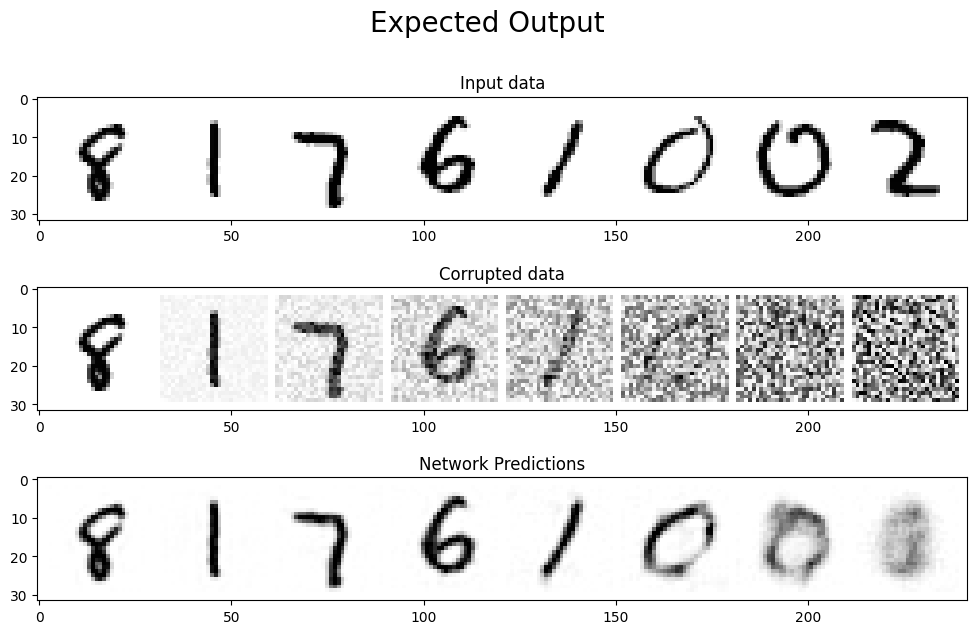

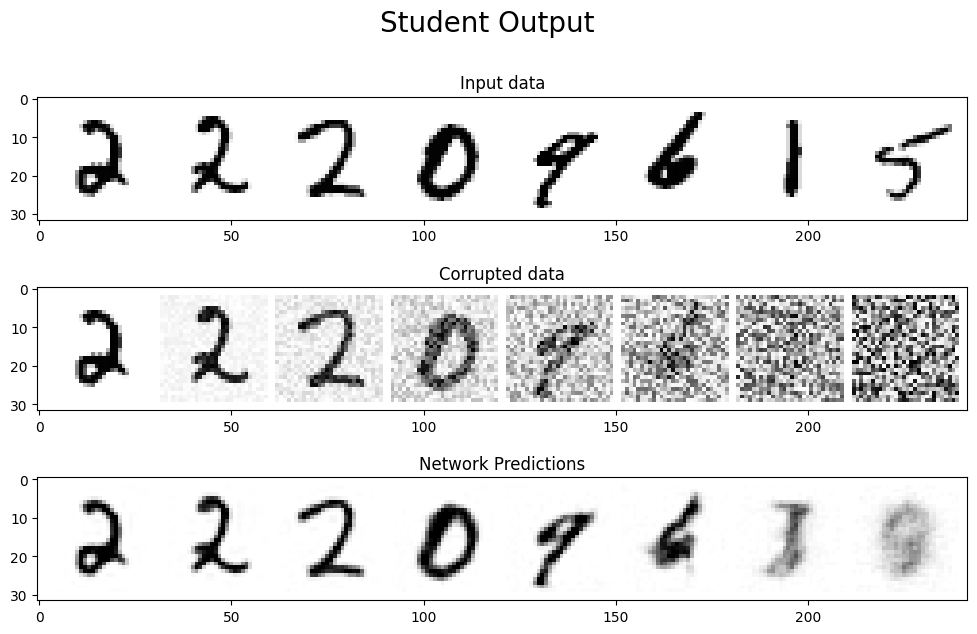

In [ ]:
# Fetch some data
x, y = next(iter(train_dataloader))
x = x[:8] # Only using the first 8 for easy plotting

# Corrupt with a range of amounts
amount = torch.linspace(0, 1, x.shape[0]) # Left to right -> more corruption
noised_x = corrupt(x, amount)

# Get the model predictions
with torch.no_grad():
  preds = net(noised_x.to(device)).detach().cpu()

# Plot
fig, axs = plt.subplots(3, 1, figsize=(12, 7))
# set title of figure
fig.suptitle("Student Output", fontsize=20)
axs[0].set_title('Input data')
axs[0].imshow(torchvision.utils.make_grid(x)[0].clip(0, 1), cmap='Greys')
axs[1].set_title('Corrupted data')
axs[1].imshow(torchvision.utils.make_grid(noised_x)[0].clip(0, 1), cmap='Greys')
axs[2].set_title('Network Predictions')
axs[2].imshow(torchvision.utils.make_grid(preds)[0].clip(0, 1), cmap='Greys');

## Question 1: Show that minimizing the Mean Square Error objective is equivalent to estimating the mean parameter of a Gaussian random variable from a set of samples through Maximum Log Liklihood Estimation.  

Answer: Minimizing the MSE is equivalent to estimating the mean parameter of a Gaussian random variable because of the Maximum Likelihood Estimator.

First we need to define the probabilistic model, where the samples are from Gaussian distribution with mean 𝜇 and a fixed variance 𝜎^2.

p(x|𝜇) = 1/sqrt(2(pi)(𝜎^2)) * e(-(x-𝜇)^2/2𝜎^2). This is to estimate which mean best explains the observed data.

Then we take the log-likelihood of this function and substitute the Gaussian probability Density function into the equation. From there we maximize the and get:

MSE = 1/N ∑ from i=1 to N (xi-𝜇)^2

Minimizing MSE loss is equivalent to MLE estimation of the mean under the assumption that the data follows a Gaussian distribution with constant variance.The optimal 𝜇 that minimizes MSE is simply the sample mean.

𝜇MLE = 1/N ∑ from i=1 to N (xi)

### Sampling the Simple Diffusion Model

If our predictions at high noise levels aren't very good, how do we generate images?

Well, what if we start from random noise, look at the model predictions but then only move a small amount towards that prediction - say, 20% of the way there. Now we have a very noisy image in which there is perhaps a hint of structure, which we can feed into the model to get a new prediction. The hope is that this new prediction is slightly better than the first one (since our starting point is slightly less noisy) and so we can take another small step with this new, better prediction.

Repeat a few times and (if all goes well) we get an image out! Note that even though the model predicts the denoised image even at step 1, we should only move x part of the way there. Over a few steps the structures appear and are refined, until we get our final outputs. Given the original noise and predicted noiseless image from the model, implement the `student_update_prediction` function.

In [ ]:
def student_update_prediction(noise, pred, current_step, total_steps):
    """
    Update the noisy image by taking a partial step towards the model's predicted image.

    Args:
        noise (torch.Tensor): The current noisy image tensor.
        pred (torch.Tensor): The predicted noiseless image tensor from the model.
        current_step (int): The current iteration step in the sampling process.
        total_steps (int): The total number of steps in the sampling process.

    Returns:
        torch.Tensor: The updated image tensor after moving partially towards the prediction.
    """
    step_size = 0.2  # Fraction of the way towards the prediction (can be tuned)
    updated_image = noise + step_size * (pred - noise)
    return updated_image


Let's visualize an example of sampling an image through generation with N=5 steps. A plausible expected output may look like this, but may vary depending on your implementation:
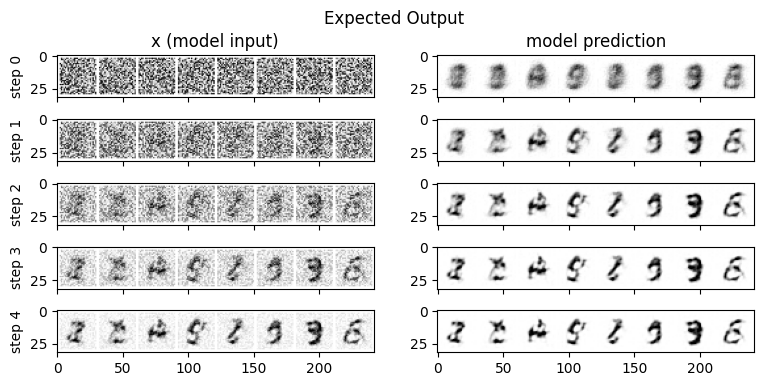

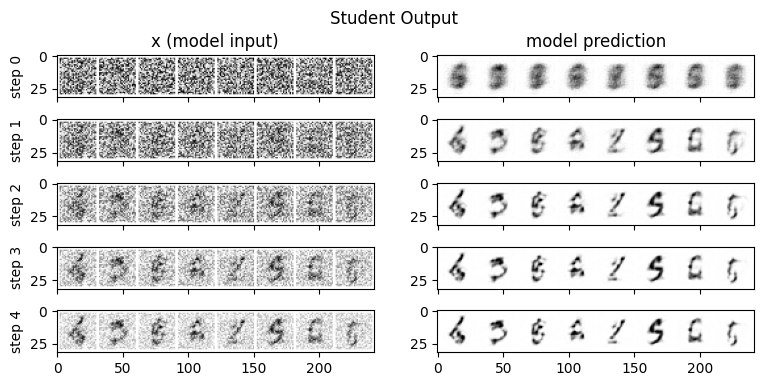

In [ ]:
#Sampling strategy: Break the process into 5 steps and move 1/5'th of the way there each time:
n_steps = 5
x = torch.rand(8, 1, 28, 28).to(device) # Start from random
step_history = [x.detach().cpu()]
pred_output_history = []

for i in range(n_steps):
    with torch.no_grad(): # No need to track gradients during inference
        pred = net(x) # Predict the denoised x0
    pred_output_history.append(pred.detach().cpu()) # Store model output for plotting
    x = student_update_prediction(x, pred, i, n_steps)
    step_history.append(x.detach().cpu()) # Store step for plotting

fig, axs = plt.subplots(n_steps, 2, figsize=(9, 4), sharex=True)
fig.suptitle("Student Output")
axs[0,0].set_title('x (model input)')
axs[0,1].set_title('model prediction')
for i in range(n_steps):
    axs[i, 0].imshow(torchvision.utils.make_grid(step_history[i])[0].clip(0, 1), cmap='Greys')
    axs[i, 1].imshow(torchvision.utils.make_grid(pred_output_history[i])[0].clip(0, 1), cmap='Greys')
    axs[i, 0].set_ylabel(f'step {i}')

We can split the process up into more steps, and hope for better images that way:

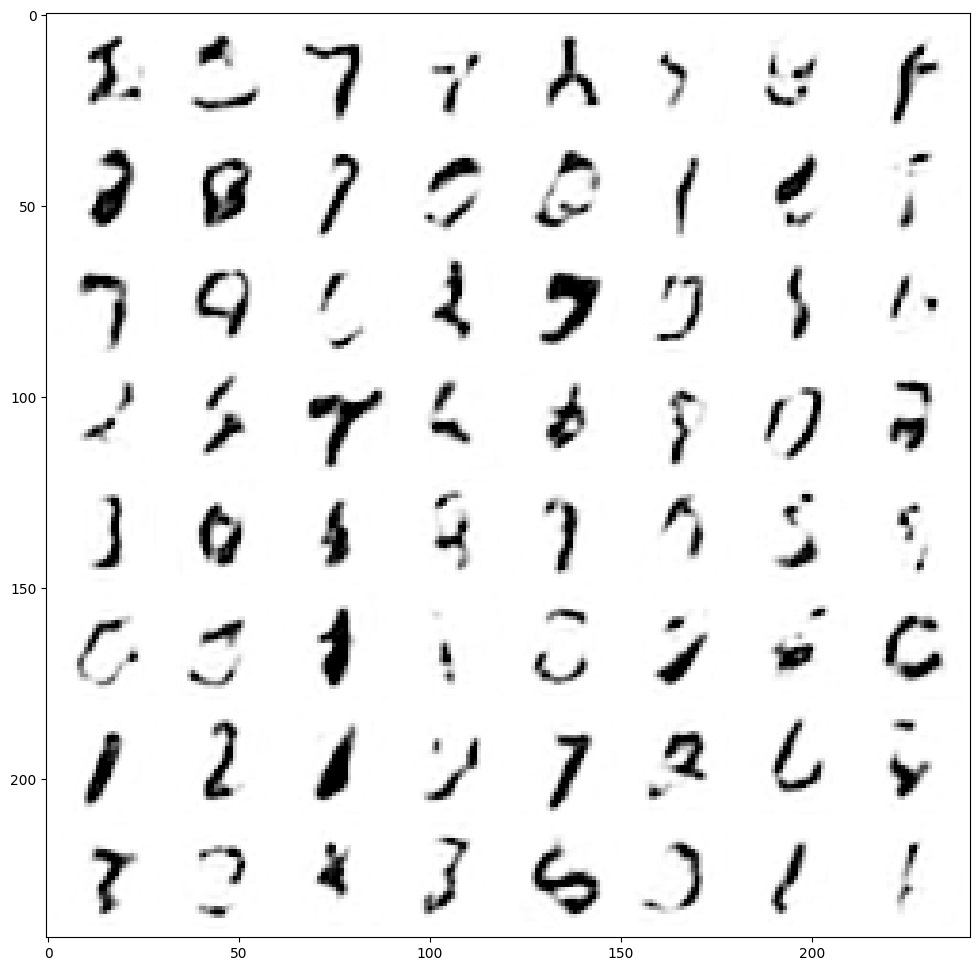

In [ ]:
#@markdown Showing more results, using 40 sampling steps
n_steps = 40
x = torch.rand(64, 1, 28, 28).to(device)
for i in range(n_steps):
  noise_amount = torch.ones((x.shape[0], )).to(device) * (1-(i/n_steps)) # Starting high going low
  with torch.no_grad():
    pred = net(x)
  mix_factor = 1/(n_steps - i)
  x = x*(1-mix_factor) + pred*mix_factor
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
ax.imshow(torchvision.utils.make_grid(x.detach().cpu(), nrow=8)[0].clip(0, 1), cmap='Greys')

Not great, but there are some recognizable digits there! You can experiment with training for longer (say, 10 or 20 epochs) and tweaking model config, learning rate, optimizer and so on. Also, don't forget that fashionMNIST is a one-line replacement if you want a slightly harder dataset to try.

## 2.2 Upgrading our Model

### Comparison To DDPM

In this section we'll take a look at how our toy implementation differs from the approach actually used in practice.

We'll see that


*   The diffusers `UNet2DModel` is a bit more advanced than our BasicUNet
*   The corruption process in handled differently
*   The training objective is different, involving predicting the noise rather than the denoised image
*   The model is conditioned on the amount of noise present via timestep conditioning, where t is passed as an additional argument to the forward method.
*   There are a number of different sampling strategies available, which should work better than our simplistic version above.

There have been a number of improvements suggested since the DDPM paper came out, but this example is hopefully instructive as to the different available design decisions. Once you've read through this, you may enjoy diving into the paper ['Elucidating the Design Space of Diffusion-Based Generative Models'](https://arxiv.org/abs/2206.00364) which explores all of these components in some detail and makes new recommendations for how to get the best performance.




In [ ]:
model = UNet2DModel(
    sample_size=28,           # the target image resolution
    in_channels=1,            # the number of input channels, 3 for RGB images
    out_channels=1,           # the number of output channels
    layers_per_block=2,       # how many ResNet layers to use per UNet block
    block_out_channels=(32, 64, 64), # Roughly matching our basic unet example
    down_block_types=(
        "DownBlock2D",        # a regular ResNet downsampling block
        "AttnDownBlock2D",    # a ResNet downsampling block with spatial self-attention
        "AttnDownBlock2D",
    ),
    up_block_types=(
        "AttnUpBlock2D",
        "AttnUpBlock2D",      # a ResNet upsampling block with spatial self-attention
        "UpBlock2D",          # a regular ResNet upsampling block
      ),
)
print(model)

UNet2DModel(
  (conv_in): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=32, out_features=128, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=128, out_features=128, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 32, eps=1e-05, affine=True)
          (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=128, out_features=32, bias=True)
          (norm2): GroupNorm(32, 32, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Conv2d(32, 32, ker

In [ ]:
sum([p.numel() for p in model.parameters()]) # 1.7M vs the ~309k parameters of the BasicUNet

1707009

100%|██████████| 469/469 [01:38<00:00,  4.77it/s]


Finished epoch 0. Average loss for this epoch: 0.018154


100%|██████████| 469/469 [01:39<00:00,  4.71it/s]


Finished epoch 1. Average loss for this epoch: 0.012542


100%|██████████| 469/469 [01:39<00:00,  4.71it/s]


Finished epoch 2. Average loss for this epoch: 0.011493


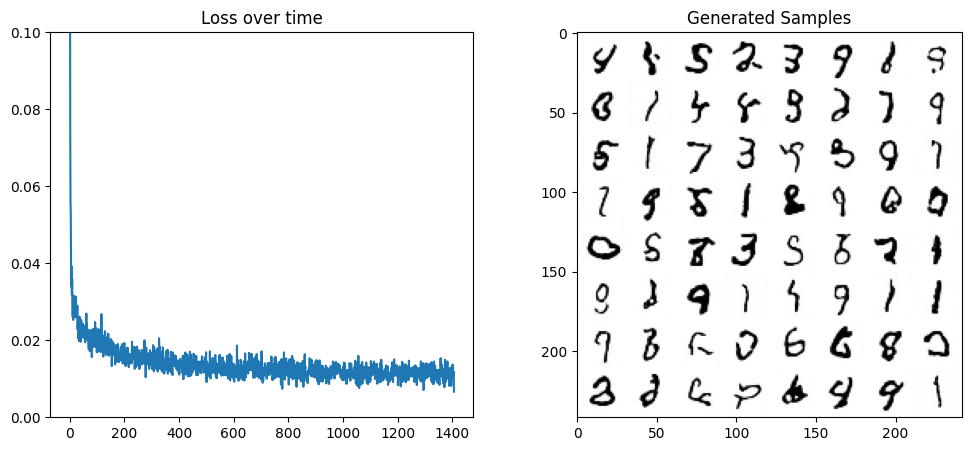

In [ ]:
#@markdown Trying UNet2DModel instead of BasicUNet with the prior code:

# Dataloader (you can mess with batch size)
batch_size = 128
train_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# How many runs through the data should we do?
n_epochs = 3

# Create the network
net = UNet2DModel(
    sample_size=28,  # the target image resolution
    in_channels=1,  # the number of input channels, 3 for RGB images
    out_channels=1,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(32, 64, 64),  # Roughly matching our basic unet example
    down_block_types=(
        "DownBlock2D",  # a regular ResNet downsampling block
        "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
        "AttnDownBlock2D",
    ),
    up_block_types=(
        "AttnUpBlock2D",
        "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
        "UpBlock2D",   # a regular ResNet upsampling block
      ),
) #<<<
net.to(device)

# The optimizer
opt = torch.optim.Adam(net.parameters(), lr=1e-3)

# Keeping a record of the losses for later viewing
losses = []

# The training loop
for epoch in range(n_epochs):

    for x, y in tqdm(train_dataloader, total=len(train_dataloader)):

        # Get some data and prepare the corrupted version
        x = x.to(device) # Data on the GPU
        noise_amount = torch.rand(x.shape[0]).to(device) # Pick random noise amounts
        noisy_x = corrupt(x, noise_amount) # Create our noisy x

        # Get the model prediction
        pred = net(noisy_x, 0).sample #<<< Using timestep 0 always, adding .sample

        # Calculate the loss
        loss = student_loss_function(pred, x) # How close is the output to the true 'clean' x?

        # Backprop and update the params:
        opt.zero_grad()
        loss.backward()
        opt.step()

        # Store the loss for later
        losses.append(loss.item())

    # Print our the average of the loss values for this epoch:
    avg_loss = sum(losses[-len(train_dataloader):])/len(train_dataloader)
    print(f'Finished epoch {epoch}. Average loss for this epoch: {avg_loss:05f}')

# Plot losses and some samples
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Losses
axs[0].plot(losses)
axs[0].set_ylim(0, 0.1)
axs[0].set_title('Loss over time')

# Samples
n_steps = 40
x = torch.rand(64, 1, 28, 28).to(device)
for i in range(n_steps):
  noise_amount = torch.ones((x.shape[0], )).to(device) * (1-(i/n_steps)) # Starting high going low
  with torch.no_grad():
    pred = net(x, 0).sample
  mix_factor = 1/(n_steps - i)
  x = x*(1-mix_factor) + pred*mix_factor

axs[1].imshow(torchvision.utils.make_grid(x.detach().cpu(), nrow=8)[0].clip(0, 1), cmap='Greys')
axs[1].set_title('Generated Samples');

### The DDPM Process

The DDPM paper describes a corruption process that adds a small amount of noise for every 'timestep'. Given $x_{t-1}$ for some timestep, we can get the next (slightly more noisy) version $x_t$ with:<br><br>

$$q(\mathbf{x}_t \vert \mathbf{x}_{t-1}) = N(\mathbf{x}_t; \mu=\sqrt{(1 - \beta_t)} \mathbf{x}_{t-1}, \sigma^2 =\beta_t \cdot \mathbf{I}) \quad
q(\mathbf{x}_{1:T} \vert \mathbf{x}_0) = \prod^T_{t=1} q(\mathbf{x}_t \vert \mathbf{x}_{t-1})$$ - Eq. 1<br><br>


That is, we take $x_{t-1}$, scale it by $\sqrt{1 - \beta_t}$ and add noise scaled by $\beta_t$. This $\beta$ is defined for every t according to some schedule, and determines how much noise is added per timestep. Now, we don't necessarily want to do this operation 500 times to get $x_{500}$ so we have another formula to get $x_t$ for any t given $x_0$: <br><br>

$$q(\mathbf{x}_t \vert \mathbf{x}_0) = N(\mathbf{x}_t; \mu=\sqrt(\bar{\alpha}_t) \mathbf{x}_0, \sigma^2=(1 - \bar{\alpha}_t) \cdot \mathbf{I})$$ - Eq. 2

where $\bar{\alpha}_t = \prod_{i=1}^T \alpha_i$ and $\alpha_i = 1-\beta_i$<br><br>

## Question 2: Derive the mean and variance of the distribution (given in Eq. 2) at a particular timestep given the transition distributions of the Markov Chain following equation 1.

Answer: The mean of the distribution in Equation 2 is:

$E[\mathbf{x}_t]\sqrt(\bar{\alpha}_t) \mathbf{x}_0$

The variance of the distribution in Equation 2 is:

Var$[\mathbf{x}_t] = (1-\bar{\alpha}_t)I $

We can plot $\sqrt{\bar{\alpha}_t}$ (labelled as `sqrt_alpha_prod`) and $\sqrt{(1 - \bar{\alpha}_t)}$ (labelled as `sqrt_one_minus_alpha_prod`) to view how the input (x) and the noise are scaled and mixed across different timesteps:


Text(0.5, 0, 'Timestep')

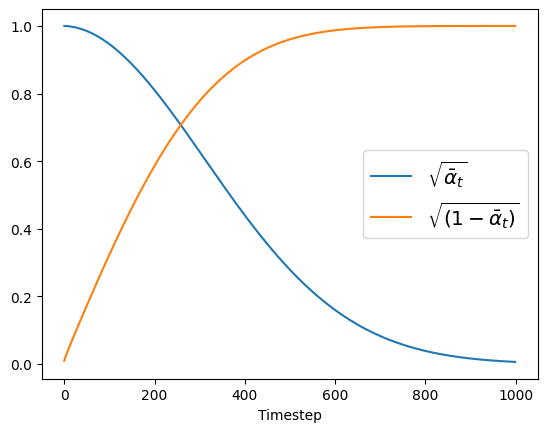

In [ ]:
noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
plt.plot(noise_scheduler.alphas_cumprod.cpu() ** 0.5, label=r"${\sqrt{\bar{\alpha}_t}}$")
plt.plot((1 - noise_scheduler.alphas_cumprod.cpu()) ** 0.5, label=r"$\sqrt{(1 - \bar{\alpha}_t)}$")
plt.legend(fontsize="x-large");
plt.xlabel("Timestep")

## Question 3: Assume that the distribution of the image at a particular time step follows $X_t$ with timesteps ranging from [0,1000] where we represent $T=1000$. Let's assume that a sample from the distribution is an image, but that we will represent it as a flattened vector where $x_t \in \mathbb{R}^d$. The initial image at $t=0$ is then $x_o$.
* To what family of distributions does this process converge to at timestep 1000?
* What is the expected value of the distribution at timestep 1000, $\mathbb{E}[X_{T}]$?
* What is the covariance matrix of the distribution at timestep 1000, $Cov(X_T, X_T)$?

Answer:

1. The family of distributions that this process converges to at timestep 1000 is the standard multivariate normal distribution because the signal disappears when the noise component is dominant.
2. The expected value of the distribution at timestep 1000 is 0 because the original signal is replaced by the Gaussian noise.
3. The covariance matrix of the distribution at timestep 1000 is the identity matrix I.

You will now implement some helper functions that calculate $sqrt(\bar{\alpha}_t)$ and $sqrt(1 - \bar{\alpha}_t)$ from the below list of betas, that will be useful later in this notebook.

torch.Size([1000])


Text(0.5, 0, 'Timestep')

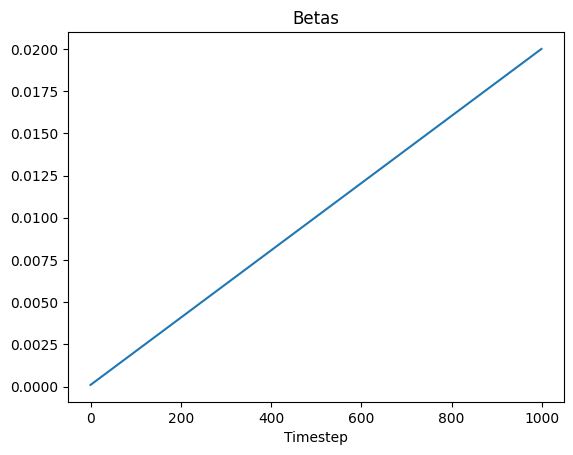

In [ ]:
betas = noise_scheduler.betas
print(betas.shape)

# Visualize the betas array
plt.figure()
plt.plot(betas)
plt.title('Betas')
plt.xlabel("Timestep")

In [ ]:
def student_generate_sqrt_bar_alpha(betas):
    """
    Compute the square root of the cumulative product of (1 - beta) values.

    Args:
        betas (torch.Tensor): A 1-dimensional tensor of beta values.

    Returns:
        torch.Tensor: A tensor containing the square roots of the cumulative products of (1 - beta) values.
    """
    alpha = 1 - betas
    bar_alpha = torch.cumprod(alpha, dim=0)
    sqrt_bar_alpha = bar_alpha ** 0.5
    return sqrt_bar_alpha

def student_generate_sqrt_one_minus_bar_alpha(betas):
    """
    Compute the square root of the complement of the cumulative product of (1 - beta) values.

    Args:
        betas (torch.Tensor): A 1-dimensional tensor of beta values (typically in the range [0, 1]).

    Returns:
        torch.Tensor: A tensor containing the square roots of (1 minus the cumulative products of (1 - beta) values).
    """
    sqrt_bar_alpha = student_generate_sqrt_bar_alpha(betas)
    sqrt_one_minus_bar_alpha = torch.sqrt(1 - sqrt_bar_alpha**2)
    return sqrt_one_minus_bar_alpha

Let's visualize your scheduler parameters below (to see if you did it correctly, you can compare against the one returned by the diffusers library above):

Text(0.5, 0, 'Timestep')

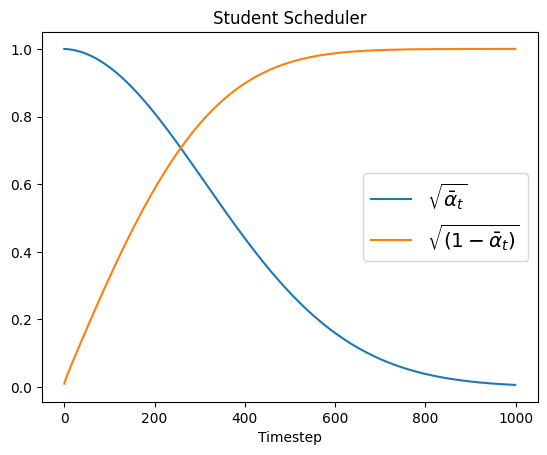

In [ ]:
sqrt_bar_alphas = student_generate_sqrt_bar_alpha(betas)
sqrt_one_minus_bar_alphas = student_generate_sqrt_one_minus_bar_alpha(betas)

plt.figure()
plt.title("Student Scheduler")
plt.plot(sqrt_bar_alphas, label=r"${\sqrt{\bar{\alpha}_t}}$")
plt.plot(sqrt_one_minus_bar_alphas, label=r"$\sqrt{(1 - \bar{\alpha}_t)}$")
plt.legend(fontsize="x-large");
plt.xlabel("Timestep")

### Class Conditioned Diffusion Model and DDPM Scheduler

Where previously we'd do something like `prediction = unet(x, t)` we'll now add the correct labels as a third argument (`prediction = unet(x, t, y)`) during training, and at inference we can pass whatever labels we want and if all goes well the model should generate images that match. `y` in this case is the labels of the MNIST digits, with values from 0 to 9.

The training loop is very similar to what we did earlier in section 2. However, now, we're predicting the noise (rather than the denoised image) to match the objective expected by the default DDPMScheduler which we're using to add noise during training and to generate samples at inference time.

Note: Training takes about <20 minutes.

In [ ]:
class ClassConditionedUnet(nn.Module):
  def __init__(self, num_classes=10, class_emb_size=4):
    super().__init__()

    # The embedding layer will map the class label to a vector of size class_emb_size
    self.class_emb = nn.Embedding(num_classes, class_emb_size)

    # Self.model is an unconditional UNet with extra input channels to accept the conditioning information (the class embedding)
    self.model = UNet2DModel(
        sample_size=28,           # the target image resolution
        in_channels=1 + class_emb_size, # Additional input channels for class cond.
        out_channels=1,           # the number of output channels
        layers_per_block=2,       # how many ResNet layers to use per UNet block
        block_out_channels=(32, 64, 64),
        down_block_types=(
            "DownBlock2D",        # a regular ResNet downsampling block
            "AttnDownBlock2D",    # a ResNet downsampling block with spatial self-attention
            "AttnDownBlock2D",
        ),
        up_block_types=(
            "AttnUpBlock2D",
            "AttnUpBlock2D",      # a ResNet upsampling block with spatial self-attention
            "UpBlock2D",          # a regular ResNet upsampling block
          ),
    )

  # Our forward method now takes the class labels as an additional argument
  def forward(self, x, t, class_labels):
    # Shape of x:
    bs, ch, w, h = x.shape

    # class conditioning in right shape to add as additional input channels
    class_cond = self.class_emb(class_labels) # Map to embedding dimension
    class_cond = class_cond.view(bs, class_cond.shape[1], 1, 1).expand(bs, class_cond.shape[1], w, h)
    # x is shape (bs, 1, 28, 28) and class_cond is now (bs, 4, 28, 28)

    # Net input is now x and class cond concatenated together along dimension 1
    net_input = torch.cat((x, class_cond), 1) # (bs, 5, 28, 28)

    # Feed this to the UNet alongside the timestep and return the prediction
    return self.model(net_input, t).sample # (bs, 1, 28, 28)

In [ ]:
# Hints:
# For these functions, make sure you use the torch library instead of numpy. (you can look up the documentation for any analogous functions on the PyTorch website)
# If you get an error similar to "tensors are not on same device", make sure that all your variables are on the gpu by doing 'x = x.to(device)'

sqrt_bar_alphas = student_generate_sqrt_bar_alpha(betas).to(device)
sqrt_one_minus_bar_alphas = student_generate_sqrt_one_minus_bar_alpha(betas).to(device)

def student_generate_random_timesteps(x, num_timesteps):
    """
    Generate random timesteps for each sample in the input tensor.

    Args:
        x (torch.Tensor): A batch of samples with shape (batch_size, ...).
        num_timesteps (int): Total number of timesteps available.

    Returns:
        torch.Tensor: A tensor of shape (batch_size,) containing random timesteps.
    """
    batch_size = x.shape[0]
    return torch.randint(0, num_timesteps, (batch_size,)).to(device)

def student_generate_noise(x):
    """
    Generate noise tensors with the same shape as the input tensor, distributed as a zero-mean unit variance Gaussian.

    Args:
        x (torch.Tensor): Input tensors for which noise will be generated.

    Returns:
        torch.Tensor: Noise tensors of the same shape as x.
    """
    return torch.randn_like(x)

def student_add_noise(x, noise, timesteps, sqrt_alphas=sqrt_bar_alphas, sqrt_one_minus_alphas=sqrt_one_minus_bar_alphas):
    """
    Add noise to an image tensor using precomputed scaling factors based on timesteps.

    Args:
        x (torch.Tensor): The clean image tensors.
        noise (torch.Tensor): The noise tensors to be added.
        timesteps (torch.Tensor): Tensor of timesteps for each sample in the batch.
        sqrt_alphas (torch.Tensor, optional): Precomputed square roots of cumulative alpha values.
        sqrt_one_minus_alphas (torch.Tensor, optional): Precomputed square roots of (1 - cumulative alpha) values.

    Returns:
        torch.Tensor: The resulting noisy image tensor.
    """
    sqrt_alpha_t = sqrt_alphas[timesteps].view(-1, 1, 1, 1)
    sqrt_one_minus_alpha_t = sqrt_one_minus_alphas[timesteps].view(-1, 1, 1, 1)
    return sqrt_alpha_t * x + sqrt_one_minus_alpha_t * noise

def student_loss_function(x, x_hat):
    """
    Compute the mean squared error (MSE) loss between the target and predicted tensors.

    Args:
        x (torch.Tensor): The target tensor.
        x_hat (torch.Tensor): The predicted tensor.

    Returns:
        torch.Tensor: A scalar tensor representing the mean squared error loss.
    """
    # You can use the same loss function from prior sections.
    return torch.nn.functional.mse_loss(x_hat, x)

def student_forward_training_pass(model, clean_image, class_label, num_timesteps):
    """
    Execute a forward training pass for the diffusion model and compute the training loss using the previously defined functions.
    Remember that the loss should be computed between the noise and the predicted noise, not the clean image and the predicted image.
    The output of the model will be the predicted noise.

    Args:
        model (torch.nn.Module): The diffusion model used for prediction.
        clean_image (torch.Tensor): The original, noise-free image tensor.
        class_label (Any): The class label or conditioning information.
        num_timesteps (int): The total number of timesteps in the diffusion process.

    Returns:
        torch.Tensor: A scalar tensor representing the computed training loss.
    """
    timesteps = student_generate_random_timesteps(clean_image, num_timesteps)
    noise = student_generate_noise(clean_image)
    noisy_image = student_add_noise(clean_image, noise, timesteps)
    prediction = model(noisy_image, timesteps, class_label)
    loss = student_loss_function(noise, prediction)
    return loss

100%|██████████| 469/469 [01:39<00:00,  4.74it/s]


Finished epoch 0. Average of the last 100 loss values: 0.032495


100%|██████████| 469/469 [01:40<00:00,  4.69it/s]


Finished epoch 1. Average of the last 100 loss values: 0.028292


100%|██████████| 469/469 [01:39<00:00,  4.69it/s]


Finished epoch 2. Average of the last 100 loss values: 0.027118


100%|██████████| 469/469 [01:39<00:00,  4.69it/s]


Finished epoch 3. Average of the last 100 loss values: 0.026435


100%|██████████| 469/469 [01:40<00:00,  4.69it/s]


Finished epoch 4. Average of the last 100 loss values: 0.024970


100%|██████████| 469/469 [01:39<00:00,  4.70it/s]


Finished epoch 5. Average of the last 100 loss values: 0.024017


100%|██████████| 469/469 [01:39<00:00,  4.70it/s]


Finished epoch 6. Average of the last 100 loss values: 0.023885


100%|██████████| 469/469 [01:40<00:00,  4.69it/s]


Finished epoch 7. Average of the last 100 loss values: 0.023249


100%|██████████| 469/469 [01:39<00:00,  4.70it/s]


Finished epoch 8. Average of the last 100 loss values: 0.022906


100%|██████████| 469/469 [01:39<00:00,  4.69it/s]

Finished epoch 9. Average of the last 100 loss values: 0.021909


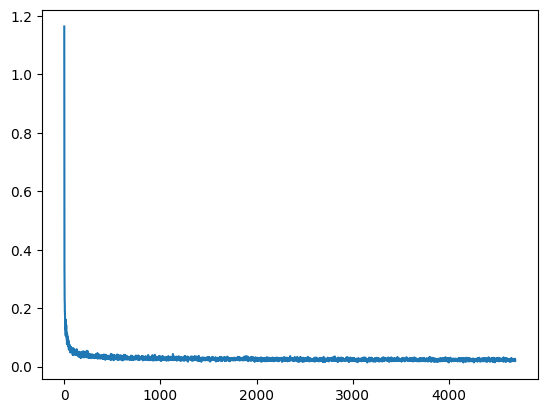

In [ ]:
# Training loop (10 Epochs):

num_timesteps = 1000

# Redefining the dataloader to set the batch size higher than the demo of 8
train_dataloader = DataLoader(dataset, batch_size=128, shuffle=True)

# How many runs through the data should we do?
n_epochs = 10

# Our network
net = ClassConditionedUnet().to(device)

# Our loss function
loss_fn = nn.MSELoss()

# The optimizer
opt = torch.optim.Adam(net.parameters(), lr=1e-3)

# Keeping a record of the losses for later viewing
losses = []

# The training loop
for epoch in range(n_epochs):
    for x, y in tqdm(train_dataloader):

        # Get some data and prepare the corrupted version
        x = x.to(device) * 2 - 1 # Data on the GPU (mapped to (-1, 1))
        y = y.to(device) #class labels

        # Forward pass through model and compute loss
        loss = student_forward_training_pass(net, x, y, num_timesteps)

        # Backprop and update the params:
        opt.zero_grad()
        loss.backward()
        opt.step()

        # Store the loss for later
        losses.append(loss.item())

    # Print out the average of the last 100 loss values to get an idea of progress:
    avg_loss = sum(losses[-100:])/100
    print(f'Finished epoch {epoch}. Average of the last 100 loss values: {avg_loss:05f}')

# View the loss curve
plt.plot(losses)

Once training finishes, we can sample some images feeding in different labels as our conditioning:

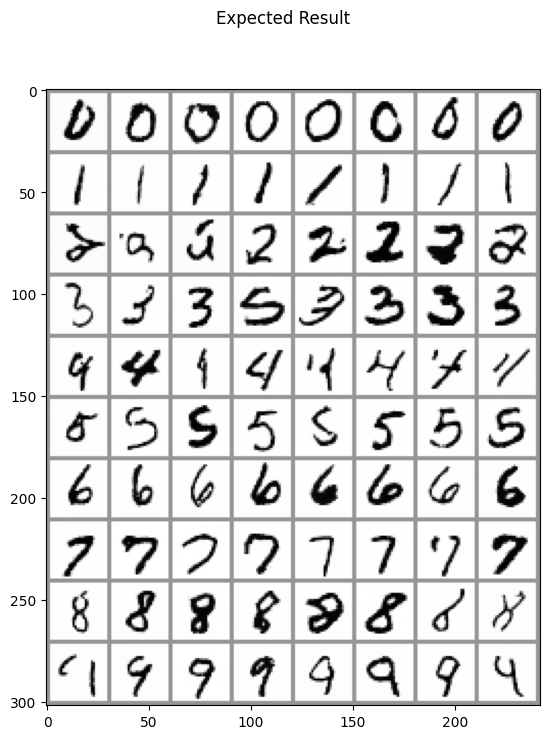

We have used the diffusers `noise_scheduler.step` function for sampling, however, feel free to write this function from scratch!

1000it [00:38, 25.65it/s]


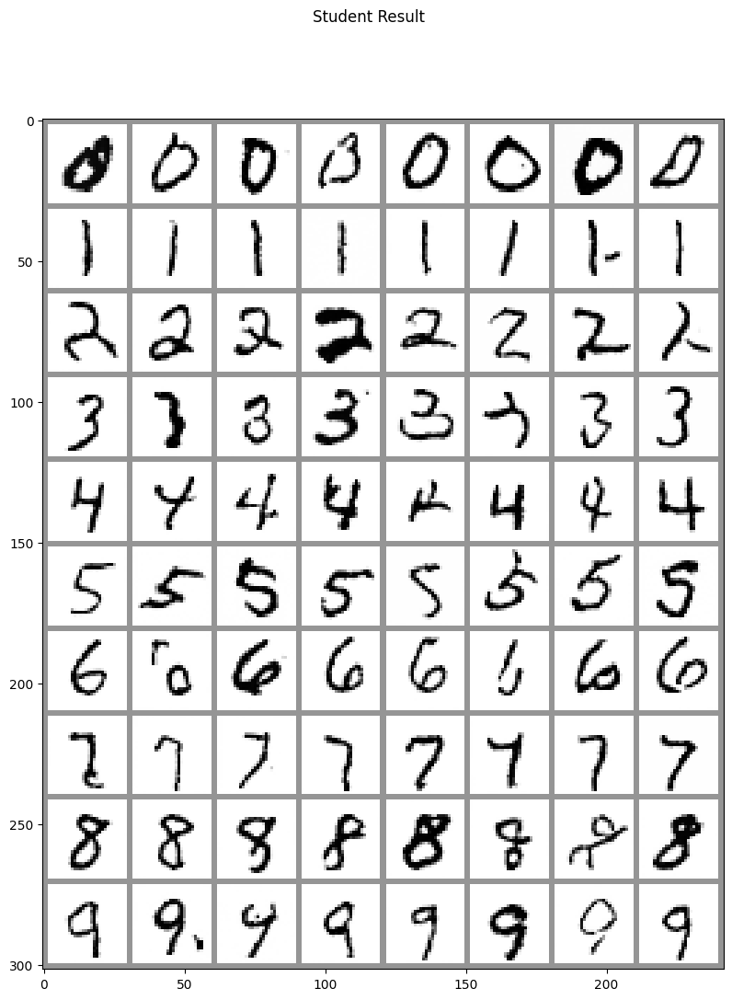

In [ ]:
#@markdown Sampling some different digits:

# Prepare random x to start from, plus some desired labels y
x = torch.randn(80, 1, 28, 28).to(device)
y = torch.tensor([[i]*8 for i in range(10)]).flatten().to(device)

# Sampling loop
for i, t in tqdm(enumerate(noise_scheduler.timesteps)):

    # Get model pred
    with torch.no_grad():
        residual = net(x, t, y)  # Again, note that we pass in our labels y

    # Update sample with step
    x = noise_scheduler.step(residual, t, x).prev_sample

# Show the results
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
fig.suptitle("Student Result")
ax.imshow(torchvision.utils.make_grid(x.detach().cpu().clip(-1, 1), nrow=8)[0], cmap='Greys')

Great! Now you have some familiarity with how to create a Diffusion model from scratch. In general, scaling this up to generating more complex images than digits 0-9 requires 'a lot' more data and compute than we have available. However, we can still import a pretrained model like Stable Diffusion and see how they work 😀

# 3. Exploring Stable Diffusion

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

# Use the GPU.
device=torch.device("cuda")

# Initialize Model
model_id = "stabilityai/stable-diffusion-2-1-base"
pipe = StableDiffusionPipeline.from_pretrained(model_id).to(device)

# Send Model to GPU
pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

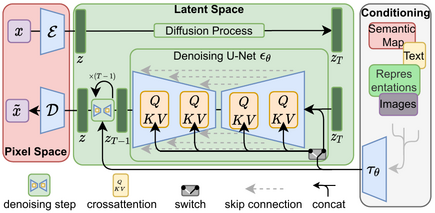

The `StableDiffusionPipeline` we're using is a little more complex than the `DDPMPipeline` we've explored in the previous units. In addition to the UNet and the scheduler, there are a number of other components included in the pipeline:

In [ ]:
print(list(pipe.components.keys())) # List components

['vae', 'text_encoder', 'tokenizer', 'unet', 'scheduler', 'safety_checker', 'feature_extractor', 'image_encoder']


## 3.1 The VAE

The VAE (variational autoencoder) is a type of model that can encode its input into a compressed representation and then decode this 'latent' representation back into something close to the original input. When generating images with Stable Diffusion, we first **generate the latents** by applying the diffusion process in the 'latent space' of the VAE, and then **decode them at the end** to view the resulting image (instead of doing this in pixel space).

Here is some code that takes an input image, encodes it to a latent representation and then decodes it again using the VAE:

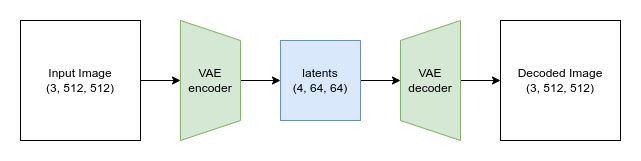

Let's use your previously generated image from section 1 to test it out!

Display the original image and the encoded->decoded image. Notice, the reconstruction isn't perfect! For example, try out a random image and see if it can reconstruct it.

In [ ]:
prompt = "a photograph of an astronaut riding a horse"
image = Image.open(f"{prompt}.png")
img_numpy = np.array(image, np.float32)/255

# Or try out a random Image
# img_numpy = np.random.rand(512, 512, 3).astype(np.float32)

images = torch.tensor(img_numpy).permute(2,0,1).unsqueeze(0).to(device)

As you can see, the 512x512 image is compressed to a 64x64 latent representation (with four channels). This 8x reduction in each spatial dimension is the reason the specified width and height need to be multiples of 8.

Working with these information-rich 4x64x64 latents is more efficient than working with massive 512px images, allowing for faster diffusion models that take less resources to train and use. The VAE decoding process is not perfect, but it is good enough that the small quality tradeoff is generally worth it.

In [ ]:
print("Input images shape:", images.shape)

# Encode to latent space
with torch.no_grad():
  latents = 0.18215 * pipe.vae.encode(images).latent_dist.mean
print("Encoded latents shape:", latents.shape)

# Decode again
with torch.no_grad():
  decoded_images = pipe.vae.decode(latents / 0.18215).sample
print("Decoded images shape:", decoded_images.shape)

Input images shape: torch.Size([1, 3, 512, 512])
Encoded latents shape: torch.Size([1, 4, 64, 64])
Decoded images shape: torch.Size([1, 3, 512, 512])


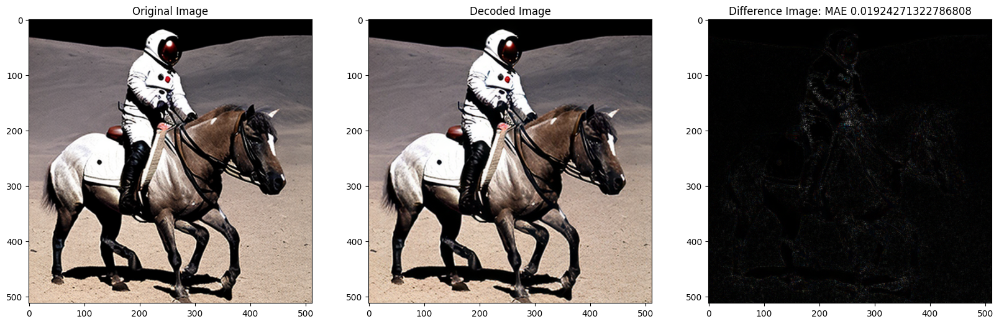

In [ ]:
original_img_numpy = img_numpy

decoded_img_numpy = decoded_images[0].permute(1,2,0).cpu().numpy()

diff_img = np.abs(original_img_numpy - decoded_img_numpy)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(original_img_numpy)
plt.title("Original Image")
plt.subplot(1,3,2)
plt.imshow(decoded_img_numpy)
plt.title("Decoded Image")
plt.subplot(1,3,3)
plt.imshow(diff_img)
plt.title(f"Difference Image: MAE {np.mean(diff_img)}")
plt.show()

### What do the latent's look like?

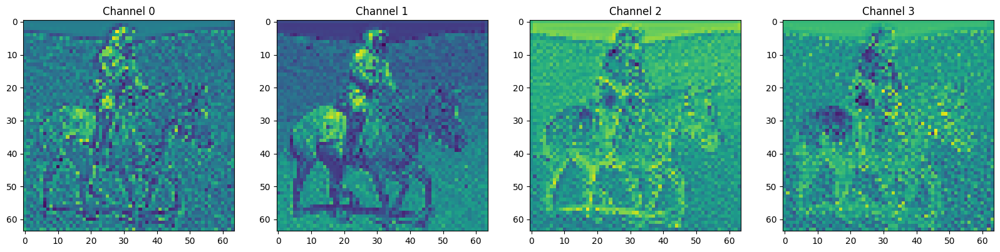

In [ ]:
plt.figure(figsize=(20,10))
for i in range(4):
  plt.subplot(1,4,i+1)
  plt.imshow(latents[0,i,:,:].cpu().numpy())
  plt.title(f"Channel {i}")
plt.show()

## 3.2 The Tokenizer and Text Encoder

Before, we conditioned on a number for the MNIST dataset. Here, we can condition on any text that fits into the `text_embedding`. However, this requires tokenization and a text encoder.

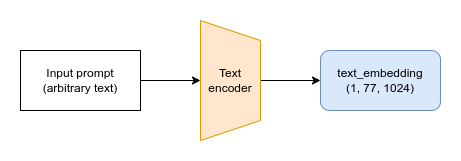

In [ ]:
# Tokenizing and encoding an example prompt manually

# Tokenize
input_ids = pipe.tokenizer(["A painting of a flooble"])['input_ids']
print("Input ID -> decoded token")
for input_id in input_ids[0]:
  print(f"{input_id} -> {pipe.tokenizer.decode(input_id)}")

# Feed through CLIP text encoder
input_ids = torch.tensor(input_ids).to(device)
with torch.no_grad():
  text_embeddings = pipe.text_encoder(input_ids)['last_hidden_state']
print("Text embeddings shape:", text_embeddings.shape)

Input ID -> decoded token
49406 -> <|startoftext|>
320 -> a
3086 -> painting
539 -> of
320 -> a
4062 -> floo
1059 -> ble
49407 -> <|endoftext|>
Text embeddings shape: torch.Size([1, 8, 1024])


In [ ]:
# Get the final text embeddings using the pipeline's encode_prompt function
text_embeddings = pipe._encode_prompt("A painting of a flooble", device, 1, True, '')
text_embeddings.shape
# Hmmm, Why is the batch size 2?

/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:308: FutureWarning: `_encode_prompt()` is deprecated and it will be removed in a future version. Use `encode_prompt()` instead. Also, be aware that the output format changed from a concatenated tensor to a tuple.
  deprecate("_encode_prompt()", "1.0.0", deprecation_message, standard_warn=False)


torch.Size([2, 77, 1024])

## 3.3 U-Net:

These text embeddings (the so-called 'hidden states' of the last transformer block in the text encoder model) will be fed to the UNet as an additional argument to the `forward` method, which we'll see in the next section.

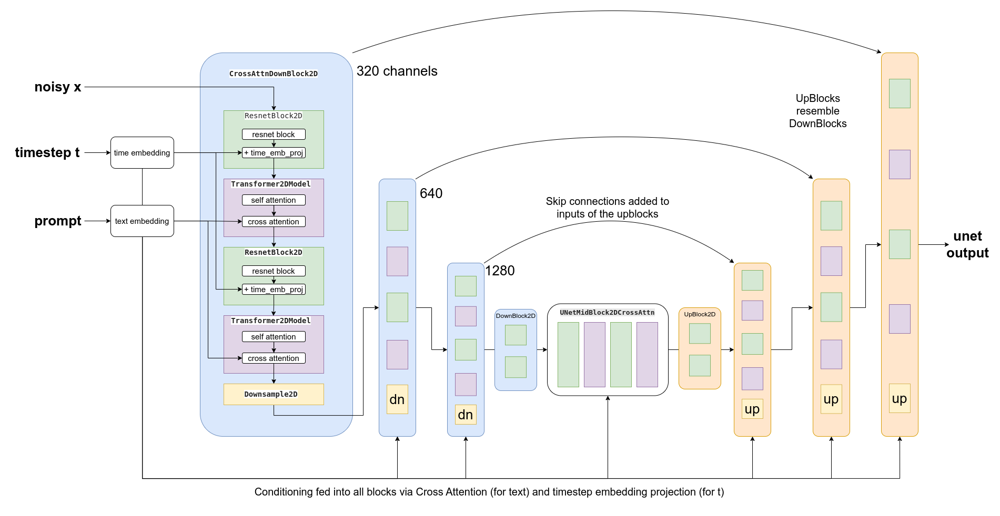

The UNet takes a noisy input and predicts the noise, just like the UNets we've seen in previous units. Unlike those previous examples, the input is not an image but is instead a latent representation of an image. And in addition to the timestep conditioning, this UNet also takes in the text embeddings of the prompt as an additional input. Here it is making predictions on some dummy data:

In [ ]:
# Dummy input1
timestep = 999
latents = torch.randn(1, 4, 64, 64).to(device)
latents = torch.cat([latents] * 2)
# Model prediction
with torch.no_grad():
  unet_output = pipe.unet(latents, timestep, text_embeddings).sample
print('UNet output shape:', unet_output.shape) # Same shape as the input latents

UNet output shape: torch.Size([2, 4, 64, 64])


Visualize the original noisy latents:

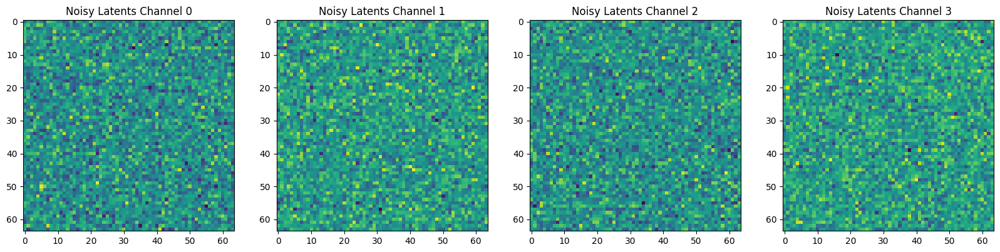

In [ ]:
plt.figure(figsize=(20,10))
for i in range(4):
  plt.subplot(1,4,i+1)
  plt.imshow(latents[0,i,:,:].cpu().numpy())
  plt.title(f"Noisy Latents Channel {i}")
plt.show()

Visualize the predicted noise of the latents:

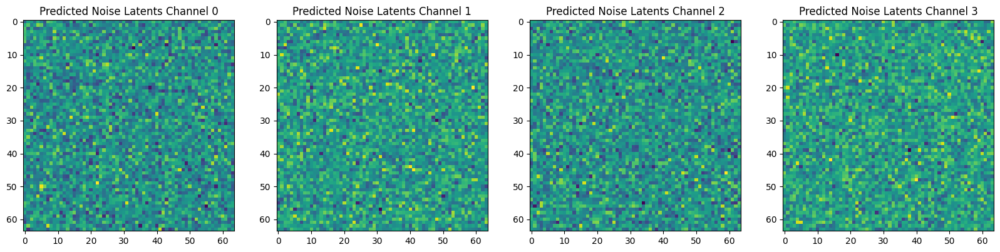

In [ ]:
plt.figure(figsize=(20,10))
for i in range(4):
  plt.subplot(1,4,i+1)
  plt.imshow(unet_output[0,i,:,:].cpu().numpy())
  plt.title(f"Predicted Noise Latents Channel {i}")
plt.show()

Visualize the difference between the predicted noise and the original latents:

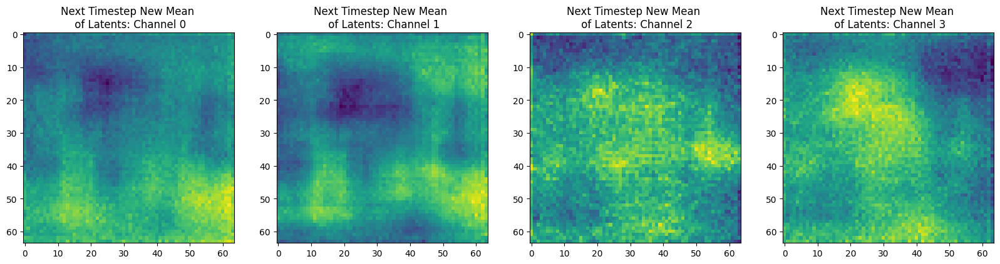

In [ ]:
diff = unet_output - latents

plt.figure(figsize=(20,10))
for i in range(4):
  plt.subplot(1,4,i+1)
  plt.imshow(diff[0,i,:,:].cpu().numpy())
  plt.title(f"Next Timestep New Mean \n of Latents: Channel {i}")
plt.show()

The result does not seem impressive, but that's because its starting from complete noise. If you went through the iterative diffusion process, you would see that the latent's become more and more detailed.

## 3.4 The Scheduler

The scheduler stores the noise schedule and manages updating the noisy sample based on the model predictions. The default scheduler is a `PNDMScheduler`, but you can use others (such as `LMSDiscreteScheduler`) as long as they are initialized with the same configuration.

We can plot the noise schedule to see the noise level (based on $\bar{\alpha}$) over time:

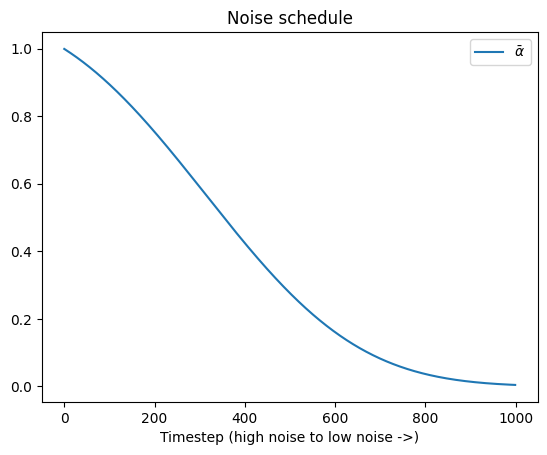

In [ ]:
pndms_steps = pipe.scheduler.alphas_cumprod
plt.plot(pndms_steps, label=r'$\bar{\alpha}$')
plt.xlabel('Timestep (high noise to low noise ->)');
plt.title('Noise schedule');plt.legend();

If you want to try out a different scheduler, you can swap in a new one as follows:

Scheduler config: LMSDiscreteScheduler {
  "_class_name": "LMSDiscreteScheduler",
  "_diffusers_version": "0.32.2",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "timestep_spacing": "linspace",
  "trained_betas": null,
  "use_beta_sigmas": false,
  "use_exponential_sigmas": false,
  "use_karras_sigmas": false
}



  0%|          | 0/50 [00:00<?, ?it/s]

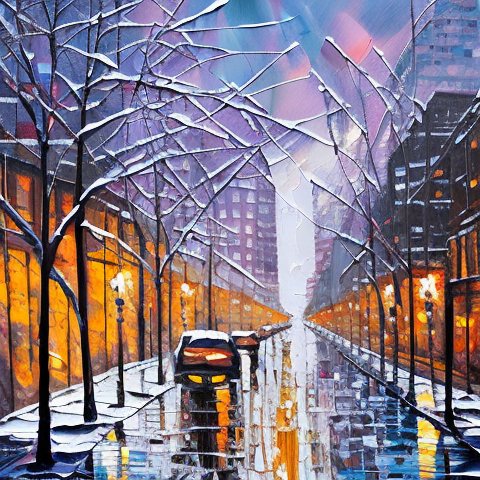

In [ ]:
from diffusers import LMSDiscreteScheduler

# Replace the scheduler
pipe.scheduler = LMSDiscreteScheduler.from_config(pipe.scheduler.config)

# Print the config
print('Scheduler config:', pipe.scheduler)

# Generate an image with this new scheduler
pipe(prompt="Palette knife painting of an winter cityscape", height=480, width=480,
     generator=torch.Generator(device=device).manual_seed(42)).images[0]

## 3.5 Classifier Free Guidance and DIY Sampling Loop

In [ ]:
def student_classifier_free_guidance(noise_pred, guidance_scale):
    """
    Apply classifier-free guidance to a noise prediction tensor.

    Args:
        noise_pred (Tensor): A tensor containing concatenated noise predictions. The first half
                             corresponds to the unconditional predictions, and the second half
                             corresponds to the text-conditioned predictions.

    Returns:
        Tensor: The guided noise prediction.
    """
    batch_size = noise_pred.shape[0]//2
    noise_pred_uncond, noise_pred_cond = noise_pred[:batch_size], noise_pred[batch_size:]
    guided_noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_cond - noise_pred_uncond)
    return guided_noise_pred

In [ ]:
guidance_scale = 8 #@param
num_inference_steps = 30 #@param
prompt = "Beautiful picture of a wave breaking" #@param
negative_prompt = "zoomed in, blurry, oversaturated, warped" #@param

# Encode the prompt
text_embeddings = pipe._encode_prompt(prompt, device, 1, True, negative_prompt)

# Create our random starting point
generator = torch.Generator(device).manual_seed(21)
latents = torch.randn((1, 4, 64, 64), device=device, generator=generator)
latents *= pipe.scheduler.init_noise_sigma

# Prepare the scheduler
pipe.scheduler.set_timesteps(num_inference_steps, device=device)

# Store Intermediate Steps
intermediate_steps = []

# Loop through the sampling timesteps
for i, t in tqdm(enumerate(pipe.scheduler.timesteps), total=num_inference_steps):

    # Expand the latents if we are doing classifier free guidance
    latent_model_input = torch.cat([latents] * 2)

    # Apply any scaling required by the scheduler
    latent_model_input = pipe.scheduler.scale_model_input(latent_model_input, t)

    # Predict the noise residual with the UNet
    with torch.no_grad():
        noise_pred = pipe.unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # Perform guidance
    noise_pred_cfg = student_classifier_free_guidance(noise_pred, guidance_scale)

    # Compute the previous noisy sample x_t -> x_t-1
    latents = pipe.scheduler.step(noise_pred_cfg, t, latents).prev_sample

    # Decode the resulting latents into an image
    with torch.no_grad():
        image = pipe.decode_latents(latents.detach())

    # View
    intermediate_steps.append(pipe.numpy_to_pil(image)[0])


100%|██████████| 30/30 [00:28<00:00,  1.07it/s]


Let's visualize the result at each timestep

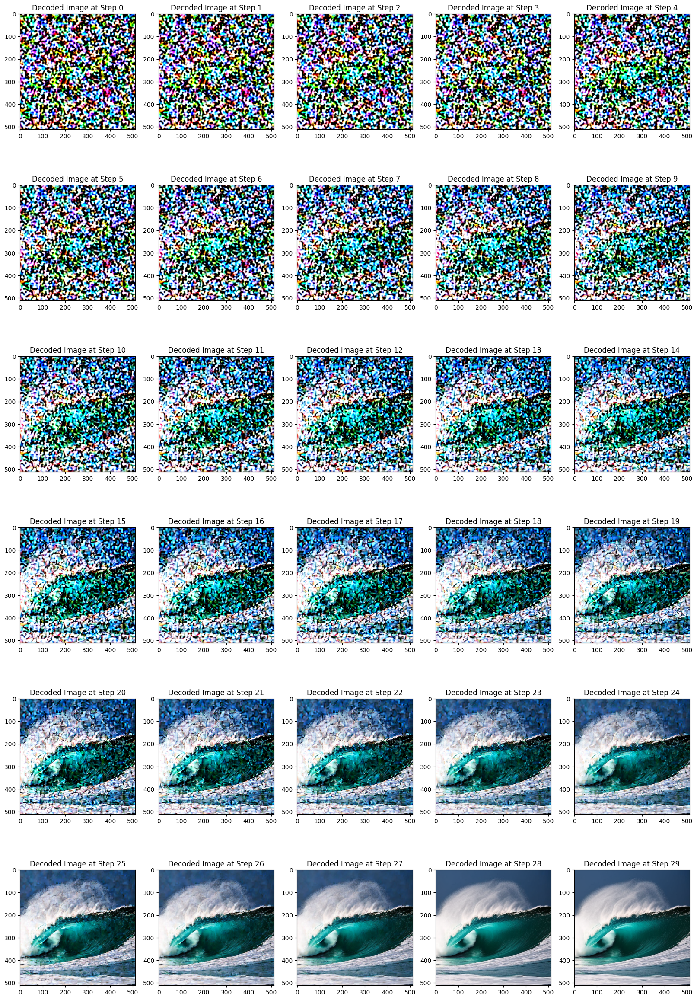

In [ ]:
plt.figure(figsize=(20,30))

cols = 5
rows = int(np.ceil(num_inference_steps/cols))
for i in range(num_inference_steps):
  plt.subplot(rows,cols,i+1)
  plt.imshow(intermediate_steps[i])
  plt.title(f"Decoded Image at Step {i}")
plt.show()

Final result!

Here is an example of what we got, yours may look a little different depending on the settings:
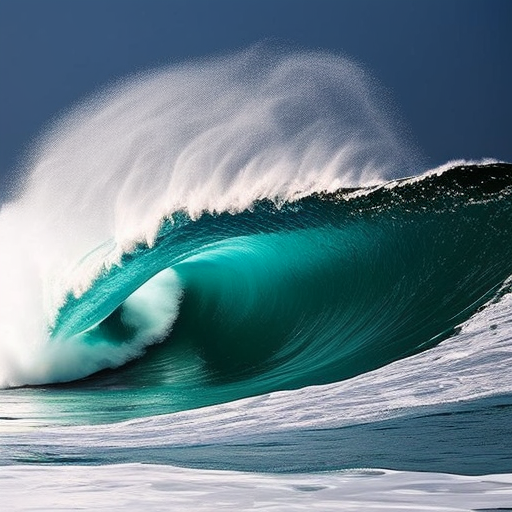

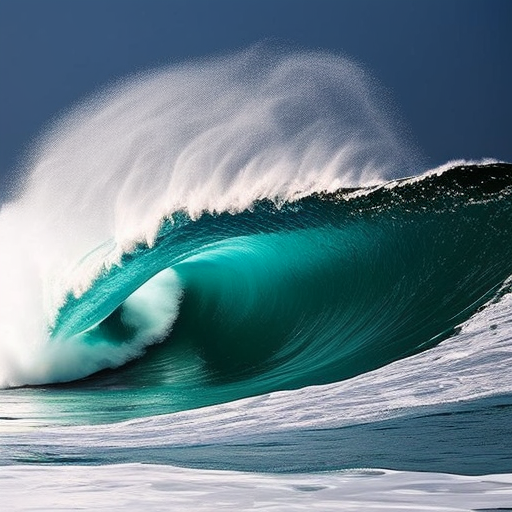

In [ ]:
pipe.numpy_to_pil(image)[0]

## Question 4: Let's analyze what happens at different CFG scales:
* What happens when you make the the classifier free guidance too high?
* Too low?
* Give the values for the scale when the unwanted behavior occurs.
* Add what the images look like at these scales.

Answer: When the CFG is too high, the image may get too distorted or noisy. When the CFG is too low, the image may look blurry or with no detail. It would be too low with any CFG under 5. It would be too high with any CFG over 15.




Low CFG: 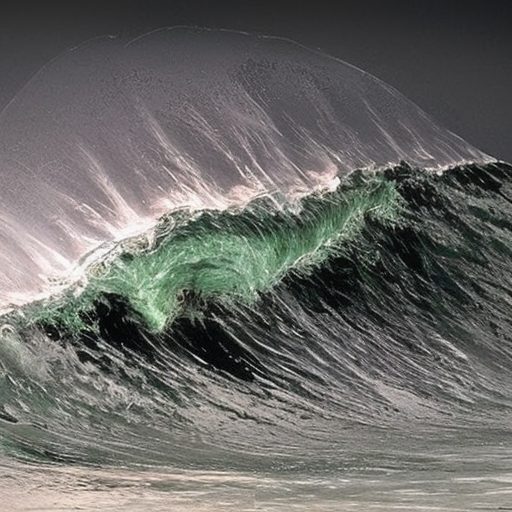

High CFG: 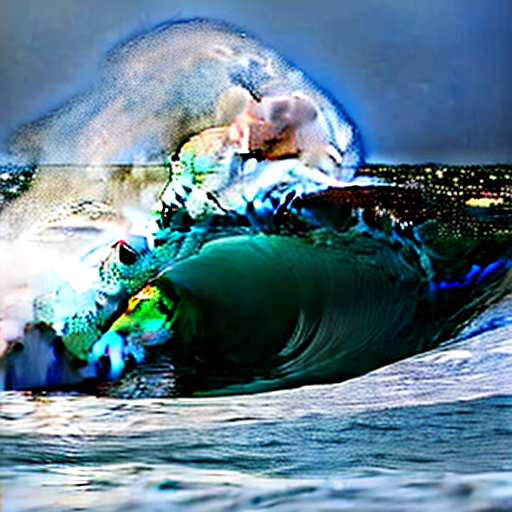

## Question 5: Given the overview of classifier free guidance from lecture, provide theoretical rationale for why the behavior you observed occurs when the classifier free guidance is too low or high.

Answer:

When the CFG is too low, the model follows the training distribution too closely and does not emphasize the conditioning enough. But diffusion models are trained with noise, so if there is no extra guidance then the sample images can end up looking blurry.

When the CFG is too high, the model follows exaggerates certain conditions and predictions which leads to unrealistic results. It does not pay attention to the rest of the image which leads to repetitive outputs because it is focused on specific details.

# 4. Additional Questions

## Question 6: At the end of the derivation of ELBO from lecture, we are left with two parts:

$$\log{p(x)} = \mathbb{E}_q[\log{\frac{p(x,z)}{q(z|x)}}] + \mathbb{E}_q[\log{\frac{q(z|x)}{p(z|x)}}]$$

* Which of these (left or right), becomes the KL Divergence term?
* Write out the full equation (including the KL divergence term) for what we would want to maximize. Note you can use LaTeX in colab by adding $$ signs before and after the equation.
* Intuitively explain what the KL Divergence term is measuring

Answer:

1. The KL divergence term is the right part, $\mathbb{E}_q[\log{\frac{q(z|x)}{p(z|x)}}]$
2. The full equation to maximize $\log p(x)$ becomes:
$$L(q) = \mathbb{E}_q[\log p(x,z)] - {\mathbb{E}_q[\log q(z|x)]}$$
3. The KL divergence term measures how different the approximate posterior is from the actual posterior. If $q(z|x)$ is close to $p(z|x)$ then the KL divergence term will be small, but if they are far apart then the KL divergence term will be large.

## Question 7: We've written out part of the derviation for ELBO for a heirarchical VAE/diffusion model below. Identify the mistakes in these steps, if there are any, and write the correct equation. If there are no mistakes, put "No mistakes"

$$\log{p(x)} = \mathbb{E}_q [\log{\frac{p(x, z_{1:T})}{q(z_{1:T}|x)}}]$$

$$\log{p(x)} =  \mathbb{E}_q [\log{\frac{p(z_T) p(x | z_1) \Pi_{t=2}^T p(z_t | z_{t-1})}{q(z_1|x) \Pi_{t=2}^T q(z_{t-1} | z_t)}}]$$

Answer:

The mistake is that the approximate posterior equation is incorrect. It should be measured like this instead in the denominator:

$q(z_T|x) \Pi_{t=1}^T q(z_t | z_{t+1}, x)$

The final equation is:

$$\log{p(x)} =  \mathbb{E}_q [\log{\frac{p(z_T) p(x | z_1) \Pi_{t=2}^T p(z_t | z_{t-1})}{q(z_T|x) \Pi_{t=1}^T q(z_t | z_{t+1}, x)}}]$$